In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import (
    silhouette_score,
    adjusted_rand_score,
    normalized_mutual_info_score
)
from sklearn.manifold import TSNE
import umap
from sentence_transformers import SentenceTransformer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

2026-03-05 01:05:48.682322: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1772672748.897522      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1772672748.958788      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1772672749.474159      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1772672749.474199      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1772672749.474201      55 computation_placer.cc:177] computation placer alr

cuda


In [2]:
pip install sentence-transformers

Note: you may need to restart the kernel to use updated packages.


=== Missing Values per Column ===
id                         0
name                       3
album_name                20
artists                    0
danceability               0
energy                     0
key                        0
loudness                   0
mode                       0
speechiness                0
acousticness               0
instrumentalness           0
liveness                   0
valence                    0
tempo                      0
duration_ms                0
lyrics                     0
year                       0
genre                      0
popularity                 0
total_artist_followers     0
avg_artist_popularity      0
artist_ids                 0
niche_genres               0
dtype: int64
=== After Replacing Missing Values ===
name                      0
album_name                0
artists                   0
danceability              0
energy                    0
key                       0
loudness                  0
mode                  

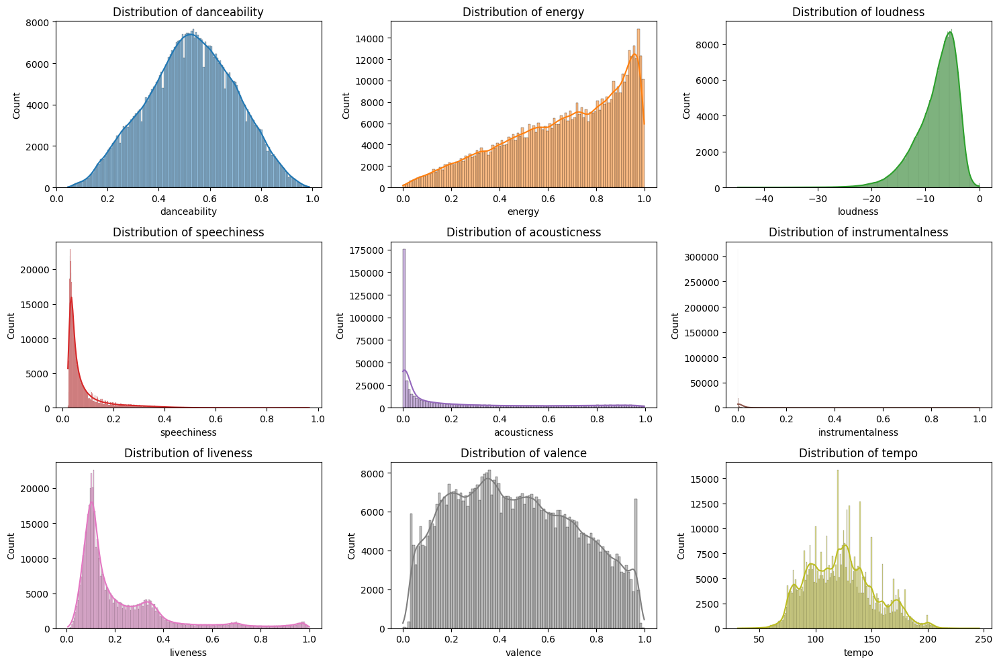

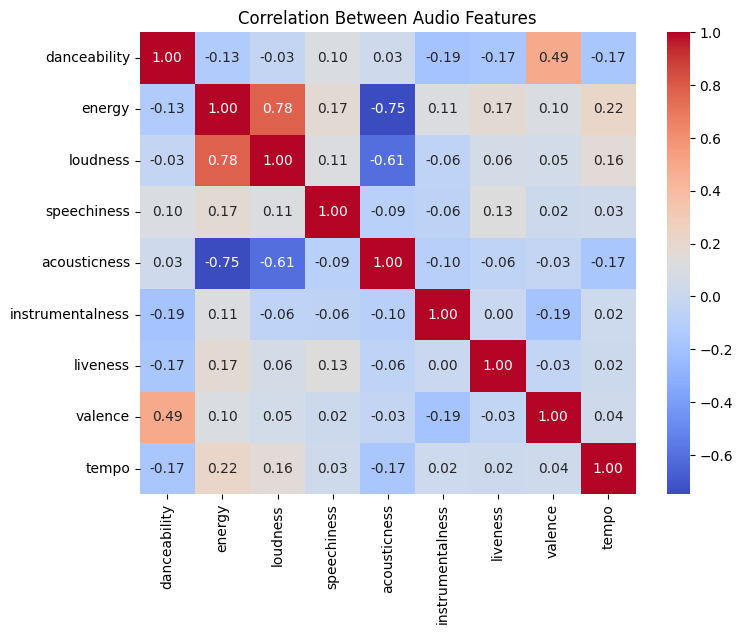

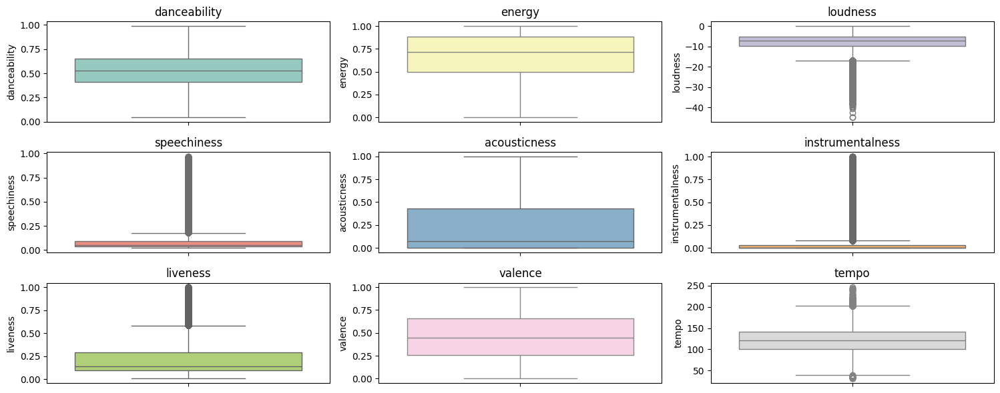

In [3]:
# Load Dataset
df = pd.read_csv("/kaggle/input/datasets/sabrina001/550k-music-dataset/songs.csv")  

# Keep only relevant numeric/audio features for this analysis and also they are the input dimension
audio_cols = ['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']

# Check for missing/null values
print("=== Missing Values per Column ===")
#print(df[audio_cols + ['lyrics','genre']].isnull().sum())
print(df.isnull().sum())

print("=== After Replacing Missing Values ===")
# Drop the 'id' column
df = df.drop(columns=['id'])

# Handle 'name' missing values (Replace with "Unknown")
df['name'] = df['name'].fillna("Unknown Name")

# Handle 'album_name' missing values (Replace with most common album)
df['album_name'] = df['album_name'].fillna(df['album_name'].mode()[0])

# Verify the results
print(df.isnull().sum())
print(df.head())

# Descriptive statistics
desc_stats = df[audio_cols].describe().T
print("=== Descriptive Statistics ===")
print(desc_stats)

# Add range (max - min) for each column
desc_stats['range'] = desc_stats['max'] - desc_stats['min']
print("\n=== Descriptive Stats with Range ===")
print(desc_stats)

# Feature Distribution Plots
plt.figure(figsize=(15,10))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Feature Distribution Plots (for all cols)
'''
cols = ['release_date','len']
plt.figure(figsize=(15,10))
for i, col in enumerate(cols):
    plt.subplot(1,2,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()
'''
# Correlation Heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df[audio_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Between Audio Features")
plt.show()

# Boxplots to check for outliers
plt.figure(figsize=(15,6))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df[col], color=sns.color_palette("Set3")[i])
    plt.title(col)
plt.tight_layout()
plt.show()


In [4]:
# Take small subset
df = df.sample(25000, random_state=42)

print(df.shape)
df.head

(25000, 23)


<bound method NDFrame.head of                             name  \
313554             Naive Monarch   
210119  I Can't Live Without You   
136837              Erase It All   
460801              The Majestic   
19995   Ain't What It Used To Be   
...                          ...   
425787          Stone Cold Fever   
385951                Satellites   
141658      Exhaustion & Disgust   
191135                      Heat   
54212                  Big Girls   

                                               album_name  \
313554                                           Versions   
210119                           I Can't Live Without You   
136837                                          Hail Mary   
460801                         Cup of Sand (2017 Reissue)   
19995                                    Billy Currington   
...                                                   ...   
425787  20th Century Masters:The Millennium Collection...   
385951                            Periphery IV: H

In [5]:
# Audio Features Preprocessing
audio_features = df[['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']].values
scaler = StandardScaler()
audio_scaled = scaler.fit_transform(audio_features)

# Lyrics Preprocessing (TF-IDF)
'''tfidf = TfidfVectorizer(max_features=1000, stop_words='english')
lyrics_tfidf = tfidf.fit_transform(df['lyrics']).toarray()
print(f"Lyrics embedding shape: {lyrics_tfidf.shape}")
'''
# Lyrics Preprocessing (Sentence Transformer)

# Load pre-trained model
model = SentenceTransformer('all-MiniLM-L6-v2')  
# Convert lyrics column to list
lyrics_list = df['lyrics'].astype(str).tolist()

# Generate embeddings
lyrics_embeddings = model.encode(
    lyrics_list,
    batch_size=64,
    show_progress_bar=True
)
print("Lyrics embedding shape:", lyrics_embeddings.shape)

# Encode Genres
le = LabelEncoder()
genre_labels = le.fit_transform(df['genre'].values)
num_genres = len(le.classes_)
print(f"Number of genres: {num_genres}")

# One-hot encoding for CVAE
genre_onehot = np.eye(num_genres)[genre_labels]

# PyTorch Dataset
class MusicDataset(Dataset):
    def __init__(self, audio, lyrics, genre_onehot):
        self.audio = torch.tensor(audio, dtype=torch.float32)
        self.lyrics = torch.tensor(lyrics, dtype=torch.float32)
        self.genre = torch.tensor(genre_onehot, dtype=torch.float32)
    def __len__(self):
        return len(self.audio)
    def __getitem__(self, idx):
        return self.audio[idx], self.lyrics[idx], self.genre[idx]

dataset = MusicDataset(audio_scaled, lyrics_embeddings, genre_onehot)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

# Conditional VAE / Beta-VAE
class CVAE(nn.Module):
    def __init__(self, audio_dim, lyrics_dim, genre_dim, latent_dim=16, beta=1.0):
        super(CVAE, self).__init__()
        self.beta = beta

        # Encoder (NO GENRE HERE)
        self.encoder = nn.Sequential(
            nn.Linear(audio_dim + lyrics_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU()
        )

        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_logvar = nn.Linear(128, latent_dim)

        # Decoder (GENRE IS USED HERE)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim + genre_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, audio_dim + lyrics_dim)
        )

    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z, genre_onehot):
        z = torch.cat([z, genre_onehot], dim=1)
        return self.decoder(z)

    def forward(self, x, genre_onehot):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z, genre_onehot)
        return recon, mu, logvar

# Loss function
def loss_function(recon, x, mu, logvar, beta=1.0):
    # MSE per sample
    MSE = torch.mean(torch.sum((recon - x)**2, dim=1))
    # KLD per sample
    KLD = -0.5 * torch.mean(torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1))
    return MSE + beta * KLD, MSE, KLD

audio_dim = audio_scaled.shape[1]
lyrics_dim = lyrics_embeddings.shape[1]
genre_dim = genre_onehot.shape[1]

print("Audio dim:", audio_dim)
print("Lyrics dim:", lyrics_dim)
print("Genre dim:", genre_dim)
print("Total CVAE input dim:", audio_dim + lyrics_dim + genre_dim)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/391 [00:00<?, ?it/s]

Lyrics embedding shape: (25000, 384)
Number of genres: 10
Audio dim: 9
Lyrics dim: 384
Genre dim: 10
Total CVAE input dim: 403


In [6]:
latent_dims = [8, 16, 32]
betas = [0.5, 1.0, 4.0]
learning_rates = [1e-3, 3e-3, 5e-3]

cluster_options = [4, 5, 6, 8]   
spectral_neighbors = [5, 10, 15]

pca_dims = [8, 16, 32]
ae_latent_dims = [8, 16, 32]

In [ ]:
# CVAE + kmeans with Hyperparameter Tuning
best_cvae = {"score": -1}
epochs = 50
for latent_dim in latent_dims:
    for beta in betas:
        for lr in learning_rates:
            for k in cluster_options:
                losses_mse = []
                losses_kld = []

                print(f"\nCVAE: latent={latent_dim}, beta={beta}, lr={lr}, clusters={k}")

                model = CVAE(audio_dim, lyrics_dim, genre_dim,
                             latent_dim=latent_dim, beta=beta).to(device)

                optimizer = torch.optim.Adam(model.parameters(), lr=lr)

                for epoch in range(epochs):
                    model.train()
                    epoch_total = 0
                    epoch_mse = 0
                    epoch_kld = 0
        
                    for audio, lyrics, genre in dataloader:
                        audio, lyrics, genre = audio.to(device), lyrics.to(device), genre.to(device)
                        x = torch.cat([audio, lyrics], dim=1)

                        optimizer.zero_grad()
                        recon, mu, logvar = model(x, genre)
                        loss, mse, kld = loss_function(recon, x, mu, logvar, beta)
                        loss.backward()
                        optimizer.step()
                        # Accumulate for epoch
                        epoch_mse += mse.item() * x.size(0)
                        epoch_kld += kld.item() * x.size(0)
                    
                    # Average over dataset
                    epoch_mse /= len(dataset)
                    epoch_kld /= len(dataset)

                    losses_mse.append(epoch_mse)
                    losses_kld.append(epoch_kld)
                    
                    print(f"Epoch {epoch+1}/{epochs}: MSE={losses_mse[-1]:.12f}, KLD={losses_kld[-1]:.12f}, Total={losses_mse[-1]+beta*losses_kld[-1]:.12f}")

                # Extract Latent
                model.eval()
                with torch.no_grad():
                    audio_tensor = torch.tensor(audio_scaled, dtype=torch.float32).to(device)
                    lyrics_tensor = torch.tensor(lyrics_embeddings, dtype=torch.float32).to(device)
                    genre_tensor = torch.tensor(genre_onehot, dtype=torch.float32).to(device)
                    X_input = torch.cat([audio_tensor, lyrics_tensor], dim=1)
                    mu, _ = model.encode(X_input)
                    latent_features = mu.cpu().numpy()
                print(f"Latent features shape: {latent_features.shape}")
                latent_features = StandardScaler().fit_transform(latent_features)

                # Clustering
                kmeans = KMeans(n_clusters=k, random_state=42)
                cluster_labels = kmeans.fit_predict(latent_features)
                try:
                    sil = silhouette_score(latent_features, cluster_labels)
                except ValueError:
                    sil = 0
                nmi = normalized_mutual_info_score(genre_labels, cluster_labels)
                ari = adjusted_rand_score(genre_labels, cluster_labels)

                # Weighted Score
                score = 0.5 * nmi + 0.3 * ari + 0.2 * sil 
                
                print(f"Sil={sil:.4f}, NMI={nmi:.4f}, ARI={ari:.4f}, Score={score:.4f}")

                if score > best_cvae["score"]:
                    best_cvae = {
                        "latent_dim": latent_dim,
                        "beta": beta,
                        "lr": lr,
                        "clusters": k,
                        "silhouette": sil,
                        "nmi": nmi,
                        "ari": ari,
                        "score": score,
                        "latent_features": latent_features,   
                        "cluster_labels": cluster_labels
                    }
                    torch.save(model.state_dict(), "best_cvae_model.pth")
                    print(f"Saved best CVAE model with .pth file.")

print("\nBest CVAE Config")
summary_keys_cvae = ["latent_dim", "beta", "lr", "clusters", "silhouette", "nmi", "ari", "score"]
print({k: best_cvae[k] for k in summary_keys_cvae})


CVAE: latent=8, beta=0.5, lr=0.001, clusters=4
Epoch 1/50: MSE=7.482718547516, KLD=1.140275156088, Total=8.052856125560
Epoch 2/50: MSE=4.482191259995, KLD=2.759575884705, Total=5.861979202347
Epoch 3/50: MSE=3.327109712830, KLD=3.607809947433, Total=5.131014686546
Epoch 4/50: MSE=2.943512244263, KLD=3.853135662842, Total=4.870080075684
Epoch 5/50: MSE=2.839247057724, KLD=3.931242270584, Total=4.804868193016
Epoch 6/50: MSE=2.777018622971, KLD=3.968208770599, Total=4.761123008270
Epoch 7/50: MSE=2.736017401199, KLD=4.001880892410, Total=4.736957847404
Epoch 8/50: MSE=2.701329029465, KLD=4.016661099854, Total=4.709659579391
Epoch 9/50: MSE=2.677172709885, KLD=4.042746754303, Total=4.698546087036
Epoch 10/50: MSE=2.651811803894, KLD=4.062287589569, Total=4.682955598679
Epoch 11/50: MSE=2.639485212936, KLD=4.051047921906, Total=4.665009173889
Epoch 12/50: MSE=2.632547183228, KLD=4.043503054199, Total=4.654298710327
Epoch 13/50: MSE=2.623134914551, KLD=4.073496387177, Total=4.659883108139

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


Epoch 1/50: MSE=8.024375903320, KLD=0.865389401884, Total=8.457070604262
Epoch 2/50: MSE=5.026681995087, KLD=2.429063714218, Total=6.241213852196
Epoch 3/50: MSE=3.771307470932, KLD=3.239727281036, Total=5.391171111450
Epoch 4/50: MSE=3.169087352219, KLD=3.672327566071, Total=5.005251135254
Epoch 5/50: MSE=3.012234787140, KLD=3.776060512619, Total=4.900265043449
Epoch 6/50: MSE=2.937359299469, KLD=3.825141357880, Total=4.849929978409
Epoch 7/50: MSE=2.890707360001, KLD=3.875609349518, Total=4.828512034760
Epoch 8/50: MSE=2.861970860672, KLD=3.896697642670, Total=4.810319682007
Epoch 9/50: MSE=2.814762960739, KLD=3.891032365265, Total=4.760279143372
Epoch 10/50: MSE=2.778514082947, KLD=3.957919392776, Total=4.757473779335
Epoch 11/50: MSE=2.749858217163, KLD=3.934254955292, Total=4.716985694809
Epoch 12/50: MSE=2.722730754395, KLD=3.977186965942, Total=4.711324237366
Epoch 13/50: MSE=2.691201865997, KLD=3.997802826996, Total=4.690103279495
Epoch 14/50: MSE=2.667560034714, KLD=4.00438620

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


Epoch 1/50: MSE=8.468295598145, KLD=0.692025733886, Total=8.814308465087
Epoch 2/50: MSE=5.858070927277, KLD=2.097092090759, Total=6.906616972656
Epoch 3/50: MSE=4.808091327209, KLD=2.688139417114, Total=6.152161035767
Epoch 4/50: MSE=3.981763211136, KLD=3.115722119064, Total=5.539624270668
Epoch 5/50: MSE=3.531872708054, KLD=3.418271037674, Total=5.241008226891
Epoch 6/50: MSE=3.159835671005, KLD=3.681055668564, Total=5.000363505287
Epoch 7/50: MSE=2.974465999603, KLD=3.821712906036, Total=4.885322452621
Epoch 8/50: MSE=2.870119686813, KLD=3.906279150391, Total=4.823259262009
Epoch 9/50: MSE=2.816123793335, KLD=3.940491223221, Total=4.786369404945
Epoch 10/50: MSE=2.761328647690, KLD=3.988152393341, Total=4.755404844360
Epoch 11/50: MSE=2.730341530304, KLD=4.000665942230, Total=4.730674501419
Epoch 12/50: MSE=2.711790120087, KLD=4.008073519440, Total=4.715826879807
Epoch 13/50: MSE=2.682610019455, KLD=4.053112342453, Total=4.709166190681
Epoch 14/50: MSE=2.658809621124, KLD=4.05546650

In [8]:
print("\nBest CVAE Config")
summary_keys_cvae = ["latent_dim", "beta", "lr", "clusters", "silhouette", "nmi", "ari", "score"]
print({k: best_cvae[k] for k in summary_keys_cvae})


Best CVAE Config
{'latent_dim': 16, 'beta': 4.0, 'lr': 0.005, 'clusters': 6, 'silhouette': np.float32(0.94883585), 'nmi': np.float64(0.08018093869228038), 'ari': 0.03263735872556592, 'score': np.float64(0.2396488439359703)}


Original shape: (10, 393)
Reconstruction shape: (10, 393)
Are shapes equal?  True


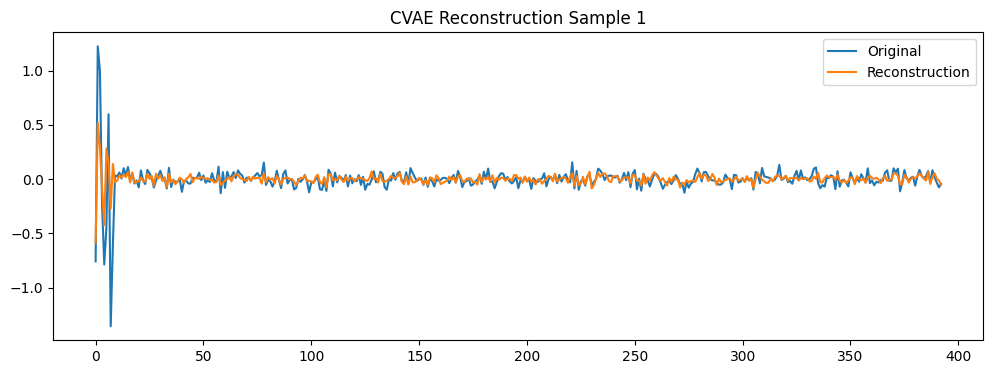

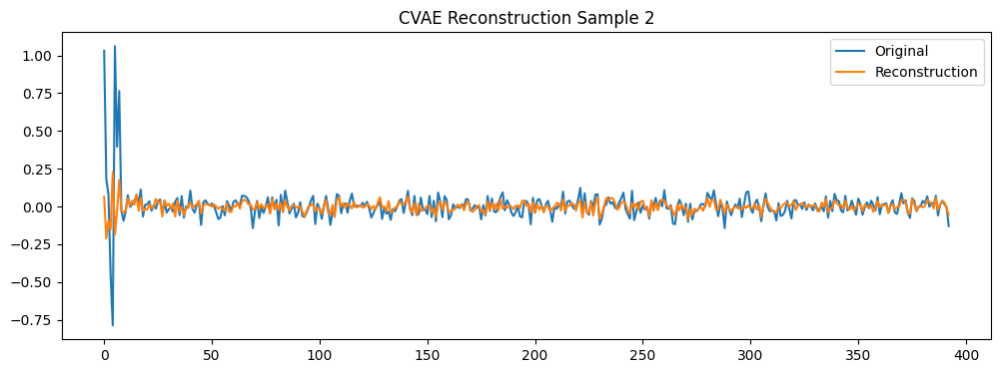

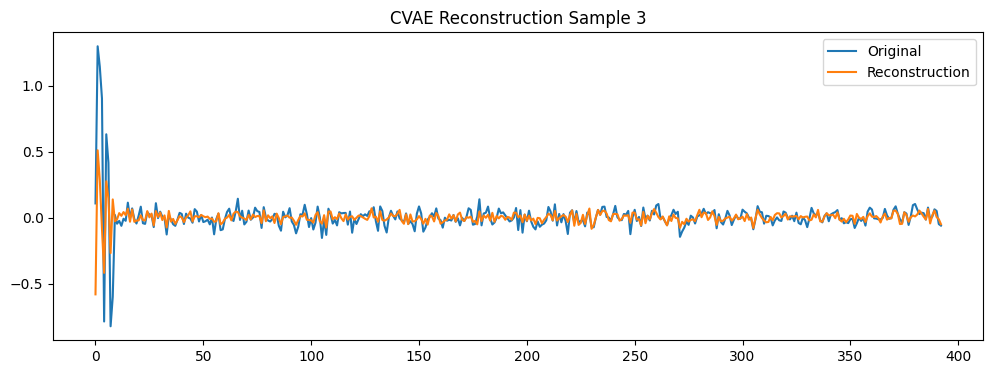

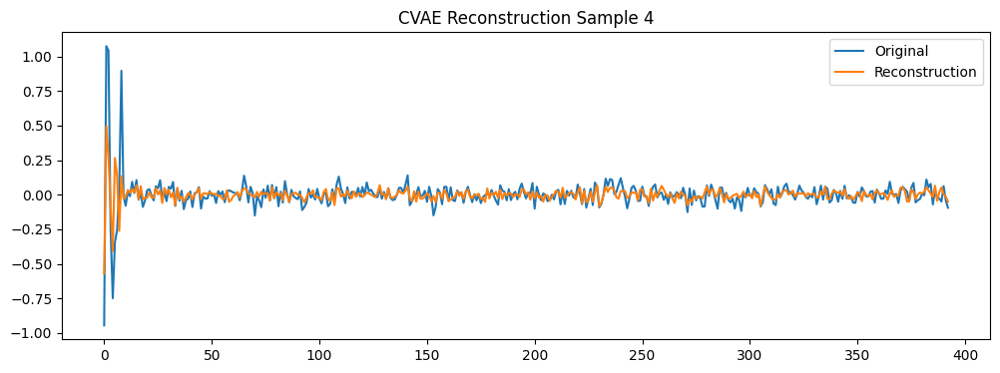

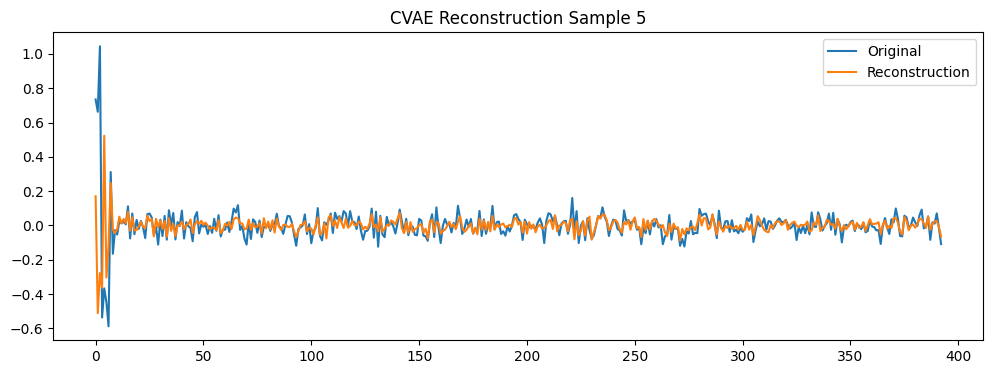

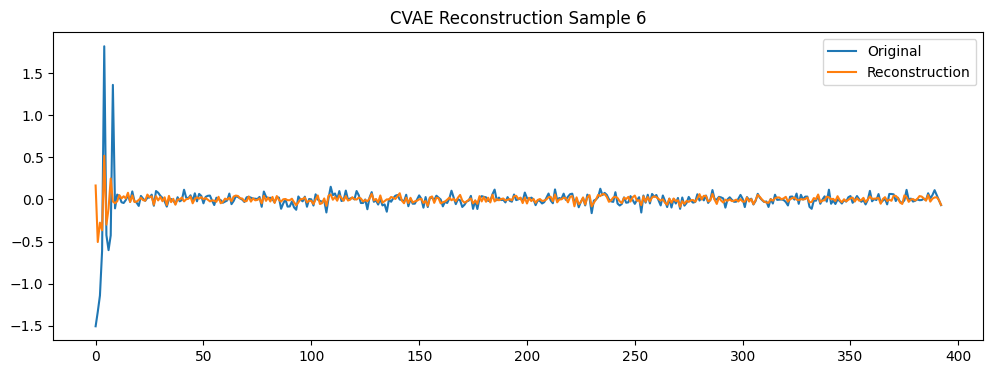

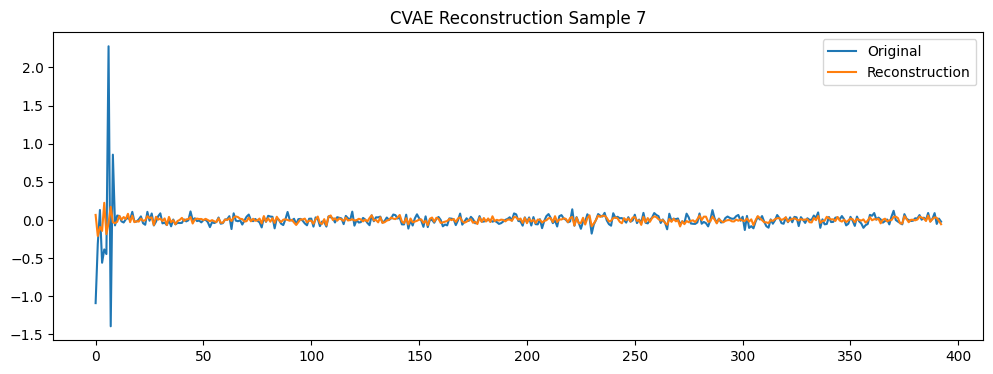

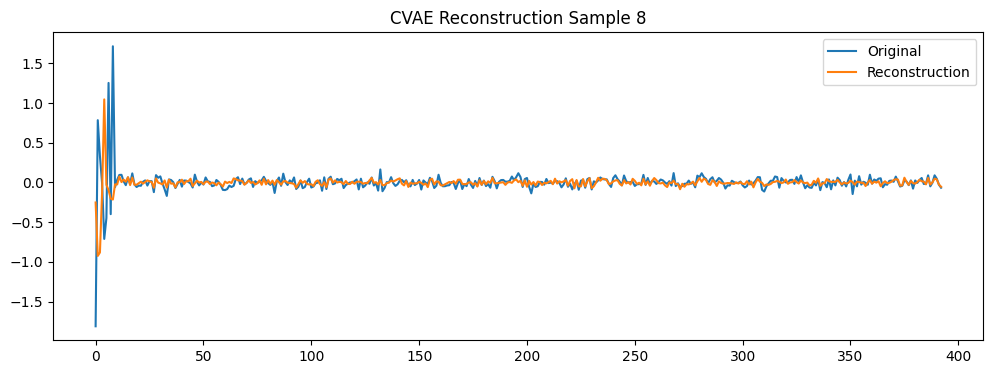

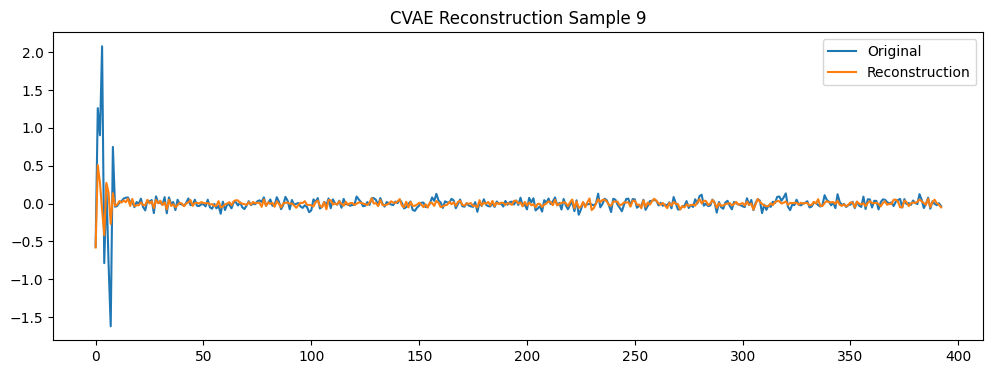

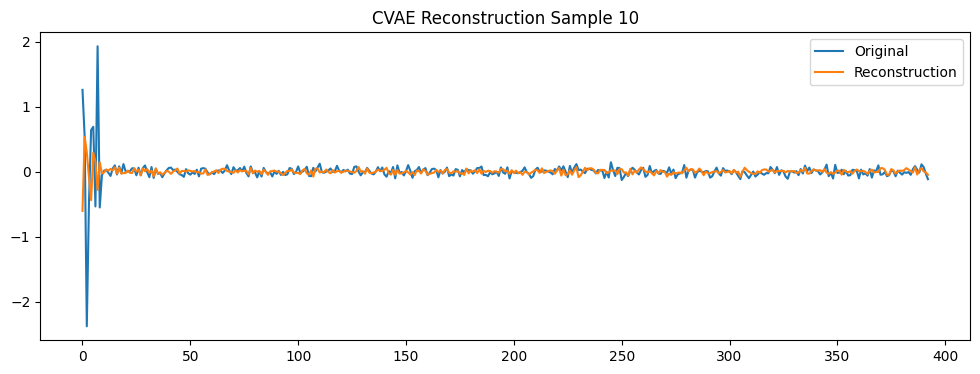

In [12]:
# Load best CVAE and do reconstructions
# Initialize model with best hyperparameters
best_latent_dim = best_cvae['latent_dim']
best_beta = best_cvae['beta']

model = CVAE(audio_dim, lyrics_dim, genre_dim,
             latent_dim=best_latent_dim,
             beta=best_beta).to(device)

# Load saved weights
model.load_state_dict(torch.load("best_cvae_model.pth", map_location=device))
model.eval()

with torch.no_grad():
    # Take first 10 samples from the dataset
    audio_tensor = torch.tensor(audio_scaled[:10], dtype=torch.float32).to(device)
    lyrics_tensor = torch.tensor(lyrics_embeddings[:10], dtype=torch.float32).to(device)
    X_tensor = torch.cat([audio_tensor, lyrics_tensor], dim=1)
    genre_tensor = torch.tensor(genre_onehot[:10], dtype=torch.float32).to(device)
    
    # Encode
    mu, logvar = model.encode(X_tensor)
    
    # Decode / reconstruct
    recon, _, _ = model(X_tensor, genre_tensor)
    
    recon = recon.cpu().numpy()
    original = X_tensor.cpu().numpy()

    print("Original shape:", original.shape)
    print("Reconstruction shape:", recon.shape)
    print("Are shapes equal? ", original.shape == recon.shape)

# Plot reconstructions
for i in range(10):
    plt.figure(figsize=(12,4))
    plt.plot(original[i], label="Original")
    plt.plot(recon[i], label="Reconstruction")
    plt.title(f"CVAE Reconstruction Sample {i+1}")
    plt.legend()
    plt.show()

In [ ]:
# PCA + Kmeans baseline with Hyperparameter Tuning
best_pca = {"score": -1}

for d in pca_dims:
    for k in cluster_options:
        print(f"\nPCA + kmeans Baseline: Dim ={d}, clusters={k}")
        X_concat = np.concatenate([audio_scaled, lyrics_embeddings], axis=1)
        pca = PCA(n_components=d)
        X_pca = pca.fit_transform(X_concat)

        labels = KMeans(n_clusters=k, random_state=42).fit_predict(X_pca)

        nmi = normalized_mutual_info_score(genre_labels, labels)
        sil = silhouette_score(X_pca, labels)
        ari = adjusted_rand_score(genre_labels, labels)
        # Weighted Score
        score = 0.5 * nmi + 0.3 * ari + 0.2 * sil 
        print(f"Sil={sil:.4f}, NMI={nmi:.4f}, ARI={ari:.4f}, Score={score:.4f}")

        if score > best_pca["score"]:
            best_pca = {
                "pca_dim": d,
                "clusters": k,
                "silhouette": sil,
                "nmi": nmi,
                "ari": ari,
                "score": score,
                "pca_features": X_pca,          
                "cluster_labels": labels              
            }

print("\nBest PCA Config")
summary_keys_pca = ["pca_dim", "clusters", "silhouette", "nmi", "ari", "score"]
print({k: best_pca[k] for k in summary_keys_pca})


PCA + kmeans Baseline: Dim =8, clusters=4
Sil=0.1868, NMI=0.1158, ARI=0.1149, Score=0.1298

PCA + kmeans Baseline: Dim =8, clusters=5
Sil=0.1903, NMI=0.1368, ARI=0.1255, Score=0.1441

PCA + kmeans Baseline: Dim =8, clusters=6
Sil=0.2017, NMI=0.1320, ARI=0.0928, Score=0.1342

PCA + kmeans Baseline: Dim =8, clusters=8
Sil=0.1627, NMI=0.1174, ARI=0.0654, Score=0.1109

PCA + kmeans Baseline: Dim =16, clusters=4
Sil=0.1720, NMI=0.1457, ARI=0.1450, Score=0.1507

PCA + kmeans Baseline: Dim =16, clusters=5
Sil=0.1831, NMI=0.1413, ARI=0.1107, Score=0.1405

PCA + kmeans Baseline: Dim =16, clusters=6
Sil=0.1917, NMI=0.1322, ARI=0.0929, Score=0.1323

PCA + kmeans Baseline: Dim =16, clusters=8
Sil=0.1717, NMI=0.1210, ARI=0.0516, Score=0.1103

PCA + kmeans Baseline: Dim =32, clusters=4
Sil=0.1751, NMI=0.1161, ARI=0.1146, Score=0.1275

PCA + kmeans Baseline: Dim =32, clusters=5
Sil=0.1303, NMI=0.1107, ARI=0.1240, Score=0.1186

PCA + kmeans Baseline: Dim =32, clusters=6
Sil=0.1874, NMI=0.1322, ARI=0.

In [ ]:
# Spectral Clustering Baseline with Hyperparameter Tuning
best_spectral = {"score": -1}

for k in cluster_options:
    for n in spectral_neighbors:
        print(f"\nSpectral Clustering Baseline: Neighbors ={n}, clusters={k}")
        spectral = SpectralClustering(
            n_clusters=k,
            affinity='nearest_neighbors',
            n_neighbors=n,
            random_state=42
        )

        labels = spectral.fit_predict(X_concat)

        nmi = normalized_mutual_info_score(genre_labels, labels)
        sil = silhouette_score(X_concat, labels)
        ari = adjusted_rand_score(genre_labels, labels)
        # Weighted Score
        score = 0.5 * nmi + 0.3 * ari + 0.2 * sil 
        print(f"Sil={sil:.4f}, NMI={nmi:.4f}, ARI={ari:.4f}, Score={score:.4f}")
        
        if score > best_spectral["score"]:
            best_spectral = {
                "clusters": k,
                "n_neighbors": n,
                "silhouette": sil,
                "nmi": nmi,
                "ari": ari,
                "score": score,
                "X_concat_features": X_concat,          
                "cluster_labels": labels  
            }

print("\nBest Spectral Config")
summary_keys_sp = ["clusters", "n_neighbors", "silhouette", "nmi", "ari", "score"]
print({k: best_spectral[k] for k in summary_keys_sp})


Spectral Clustering Baseline: Neighbors =5, clusters=4
Sil=0.2049, NMI=0.0841, ARI=0.0335, Score=0.0931

Spectral Clustering Baseline: Neighbors =10, clusters=4
Sil=0.2063, NMI=0.0841, ARI=0.0356, Score=0.0940

Spectral Clustering Baseline: Neighbors =15, clusters=4
Sil=0.2068, NMI=0.0844, ARI=0.0357, Score=0.0943

Spectral Clustering Baseline: Neighbors =5, clusters=5
Sil=0.2069, NMI=0.0773, ARI=0.0189, Score=0.0857

Spectral Clustering Baseline: Neighbors =10, clusters=5
Sil=0.1599, NMI=0.1030, ARI=0.0210, Score=0.0898

Spectral Clustering Baseline: Neighbors =15, clusters=5
Sil=0.1588, NMI=0.1102, ARI=0.0388, Score=0.0985

Spectral Clustering Baseline: Neighbors =5, clusters=6
Sil=0.1676, NMI=0.1207, ARI=0.1019, Score=0.1244

Spectral Clustering Baseline: Neighbors =10, clusters=6
Sil=0.1651, NMI=0.1197, ARI=0.0842, Score=0.1181

Spectral Clustering Baseline: Neighbors =15, clusters=6
Sil=0.1641, NMI=0.1190, ARI=0.0757, Score=0.1151

Spectral Clustering Baseline: Neighbors =5, clus

In [14]:
# Autoencoder + KMeans Baseline with Hyperparameter Tuning
best_ae = {"score": -1}

for latent_dim in ae_latent_dims:  
    for k in cluster_options:      
        
        print(f"\nAE Baseline: latent_dim={latent_dim}, clusters={k}")
        
        # Define AE Model 
        class Autoencoder(nn.Module):
            def __init__(self, input_dim, latent_dim=16):
                super(Autoencoder, self).__init__()
                
                self.encoder = nn.Sequential(
                    nn.Linear(input_dim, 128),
                    nn.ReLU(),
                    nn.Linear(128, latent_dim)
                )

                self.decoder = nn.Sequential(
                    nn.Linear(latent_dim, 128),
                    nn.ReLU(),
                    nn.Linear(128, input_dim)
                )

            def forward(self, x):
                z = self.encoder(x)
                recon = self.decoder(z)
                return recon, z

        # Train AE 
        ae_model = Autoencoder(X_concat.shape[1], latent_dim).to(device)
        ae_optimizer = torch.optim.Adam(ae_model.parameters(), lr=1e-3)
        X_tensor = torch.tensor(X_concat, dtype=torch.float32).to(device)
        
        epochs = 50
        losses = []
        for epoch in range(epochs):
            ae_optimizer.zero_grad()
            recon, z = ae_model(X_tensor)
            loss = nn.MSELoss()(recon, X_tensor)
            loss.backward()
            ae_optimizer.step()
            losses.append(loss.item())
            print(f"Epoch {epoch+1}/{epochs}, MSE Loss: {loss.item():.8f}")
            
        # Extract latent features
        ae_model.eval()
        with torch.no_grad():
            latent_features = ae_model.encoder(X_tensor).cpu().numpy()
        latent_features = StandardScaler().fit_transform(latent_features)
        
        # KMeans Clustering 
        kmeans = KMeans(n_clusters=k, random_state=42)
        cluster_labels = kmeans.fit_predict(latent_features)
        
        # Compute Metrics
        sil = silhouette_score(latent_features, cluster_labels)
        nmi = normalized_mutual_info_score(genre_labels, cluster_labels)
        ari = adjusted_rand_score(genre_labels, cluster_labels)
        
        # Weighted score
        score = 0.5 * nmi + 0.3 * ari + 0.2 * sil
        print(f"Sil={sil:.4f}, NMI={nmi:.4f}, ARI={ari:.4f}, Score={score:.4f}")
        
        if score > best_ae["score"]:
            best_ae = {
                "latent_dim": latent_dim,
                "clusters": k,
                "silhouette": sil,
                "nmi": nmi,
                "ari": ari,
                "score": score,
                "ae_features": latent_features,   
                "cluster_labels": cluster_labels     
            }

print("\nBest AE + KMeans Configuration")
summary_keys_ae = ["latent_dim", "clusters", "silhouette", "nmi", "ari", "score"]
print({k: best_ae[k] for k in summary_keys_ae})


AE Baseline: latent_dim=8, clusters=4
Epoch 1/50, MSE Loss: 0.03339755
Epoch 2/50, MSE Loss: 0.03167125
Epoch 3/50, MSE Loss: 0.03025958
Epoch 4/50, MSE Loss: 0.02910052
Epoch 5/50, MSE Loss: 0.02814567
Epoch 6/50, MSE Loss: 0.02736086
Epoch 7/50, MSE Loss: 0.02672045
Epoch 8/50, MSE Loss: 0.02620236
Epoch 9/50, MSE Loss: 0.02578763
Epoch 10/50, MSE Loss: 0.02545949
Epoch 11/50, MSE Loss: 0.02520215
Epoch 12/50, MSE Loss: 0.02500062
Epoch 13/50, MSE Loss: 0.02484118
Epoch 14/50, MSE Loss: 0.02471153
Epoch 15/50, MSE Loss: 0.02460150
Epoch 16/50, MSE Loss: 0.02450314
Epoch 17/50, MSE Loss: 0.02441034
Epoch 18/50, MSE Loss: 0.02431842
Epoch 19/50, MSE Loss: 0.02422393
Epoch 20/50, MSE Loss: 0.02412449
Epoch 21/50, MSE Loss: 0.02401856
Epoch 22/50, MSE Loss: 0.02390498
Epoch 23/50, MSE Loss: 0.02378277
Epoch 24/50, MSE Loss: 0.02365079
Epoch 25/50, MSE Loss: 0.02350777
Epoch 26/50, MSE Loss: 0.02335222
Epoch 27/50, MSE Loss: 0.02318253
Epoch 28/50, MSE Loss: 0.02299717
Epoch 29/50, MSE L

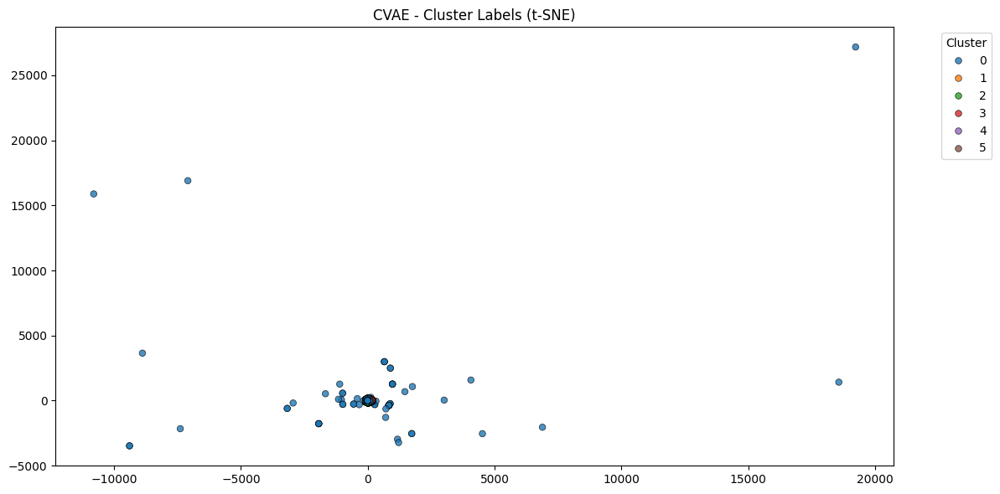

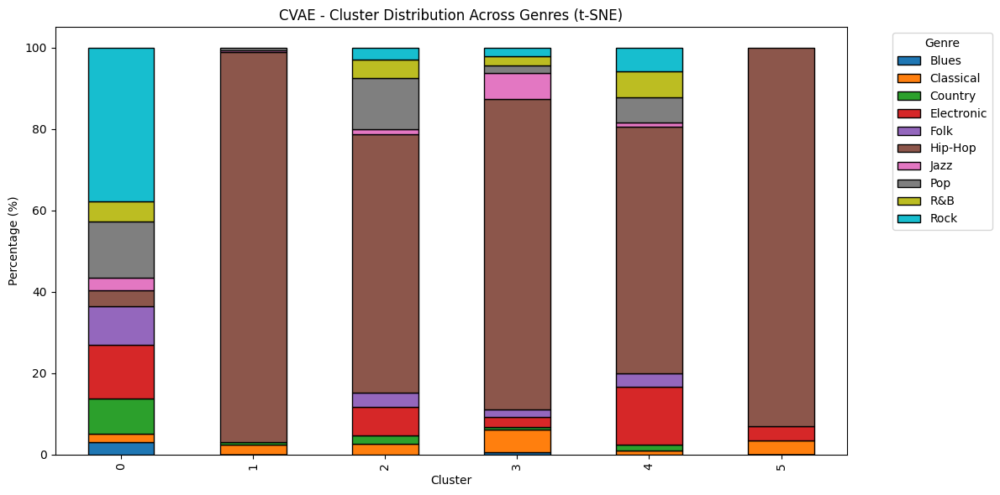

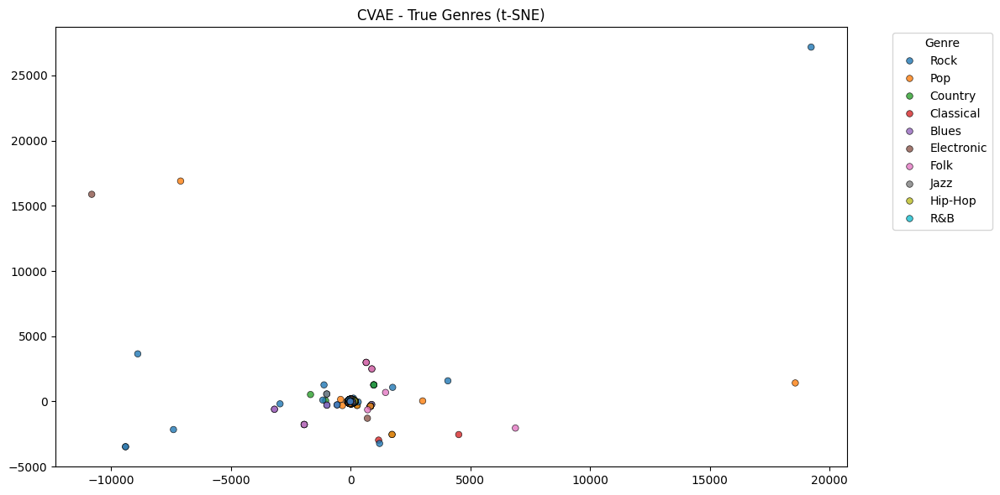

===== CVAE Cluster to Genre Mapping (t-SNE) =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop   R&B  \
row_0                                                                           
0        733        493     2041        3087  2265      901   750  3271  1177   
1          0          4        1           0     0      160     1     1     0   
2          0         11        8          28    14      256     5    51    18   
3          2         21        2           9     7      283    24     7     8   
4          0          4        6          56    13      239     4    25    25   
5          0          1        0           1     0       27     0     0     0   

genre  Rock  
row_0        
0      8917  
1         0  
2        12  
3         8  
4        23  
5         0  

Predominant genre per cluster:
row_0
0       Rock
1    Hip-Hop
2    Hip-Hop
3    Hip-Hop
4    Hip-Hop
5    Hip-Hop
dtype: object


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


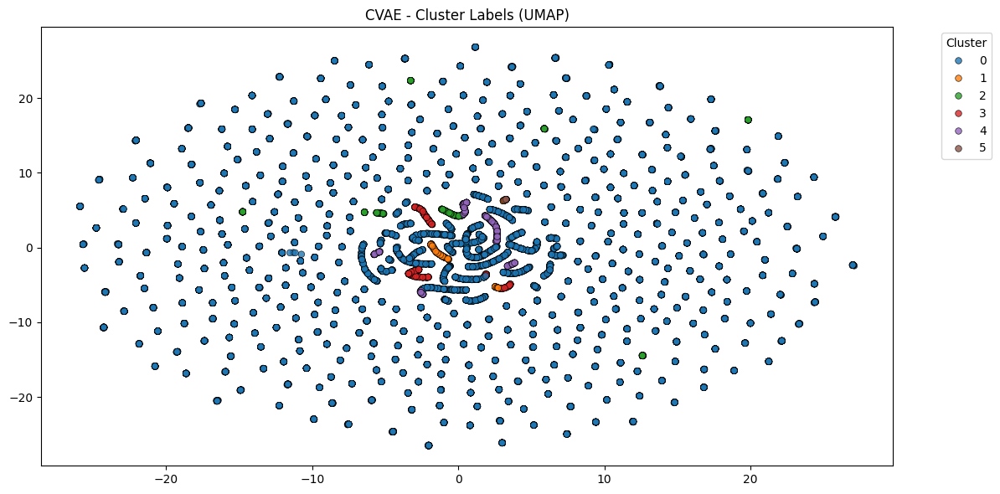

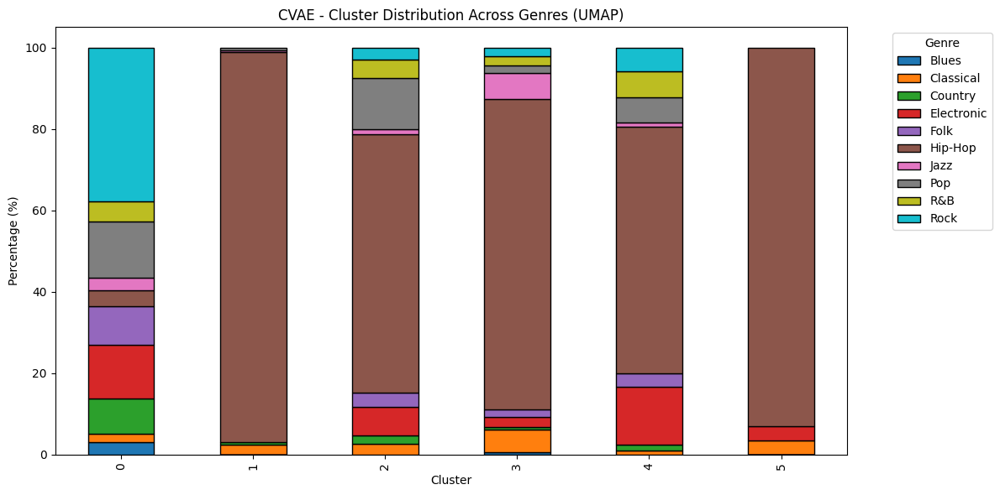

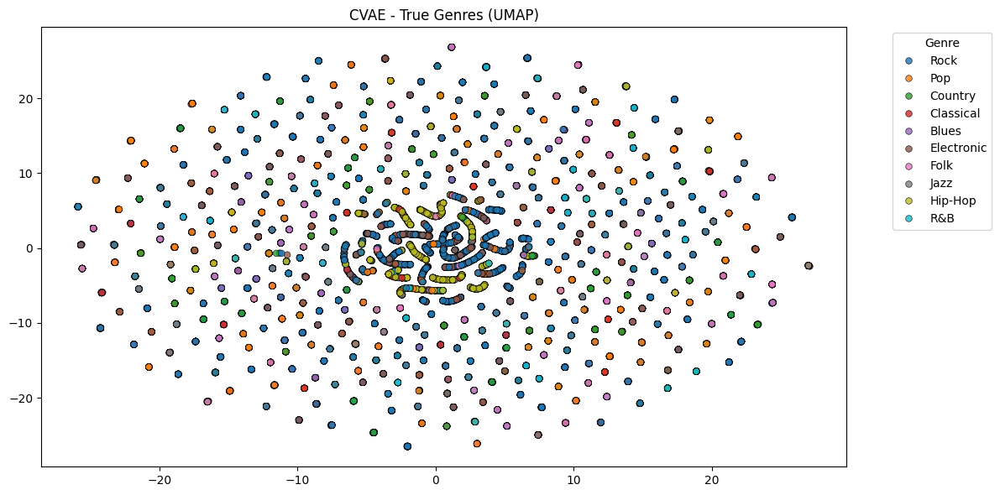

===== CVAE Cluster to Genre Mapping (UMAP) =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop   R&B  \
row_0                                                                           
0        733        493     2041        3087  2265      901   750  3271  1177   
1          0          4        1           0     0      160     1     1     0   
2          0         11        8          28    14      256     5    51    18   
3          2         21        2           9     7      283    24     7     8   
4          0          4        6          56    13      239     4    25    25   
5          0          1        0           1     0       27     0     0     0   

genre  Rock  
row_0        
0      8917  
1         0  
2        12  
3         8  
4        23  
5         0  

Predominant genre per cluster:
row_0
0       Rock
1    Hip-Hop
2    Hip-Hop
3    Hip-Hop
4    Hip-Hop
5    Hip-Hop
dtype: object


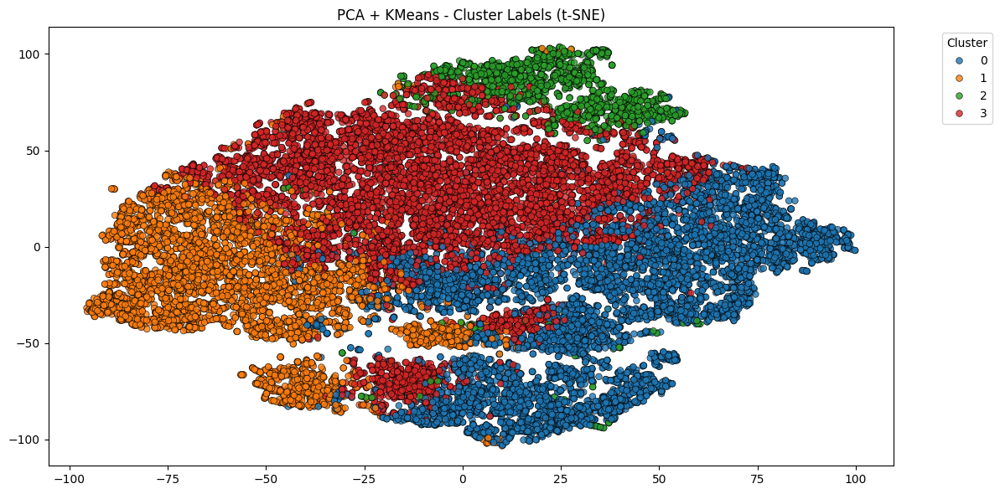

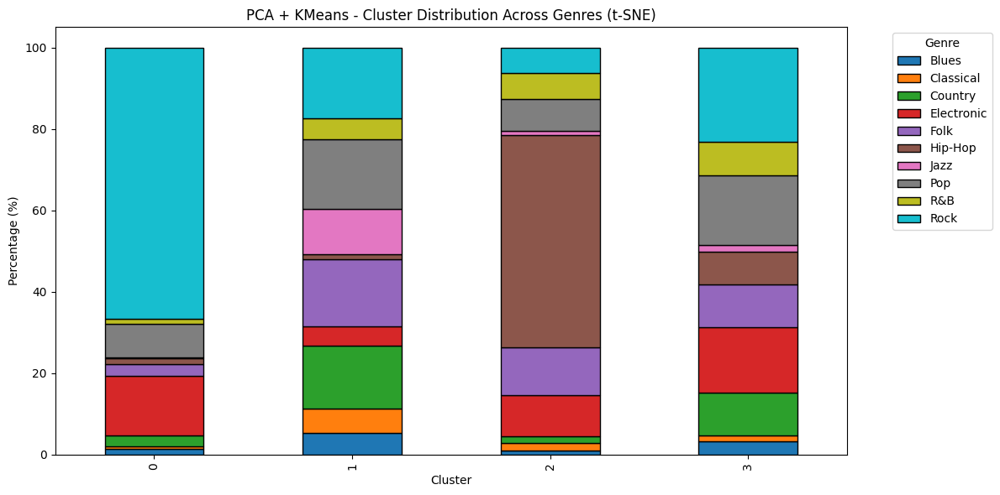

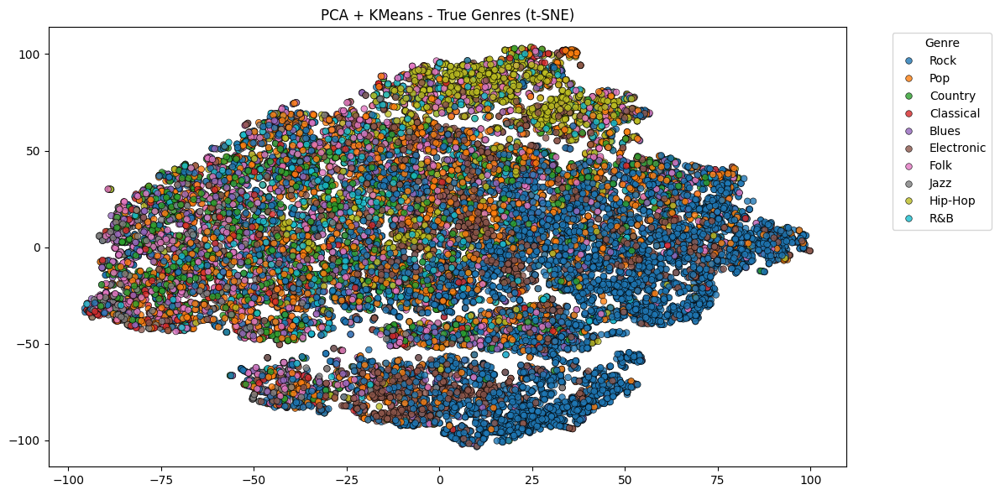

===== PCA + KMeans Cluster to Genre Mapping (t-SNE) =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0        122         50      234        1280   245      123    13   728   96   
1        292        325      848         266   896       71   613   934  282   
2         18         34       29         182   213      947    18   142  117   
3        303        125      947        1453   945      725   140  1551  733   

genre  Rock  
row_0        
0      5802  
1       956  
2       113  
3      2089  

Predominant genre per cluster:
row_0
0       Rock
1       Rock
2    Hip-Hop
3       Rock
dtype: object


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


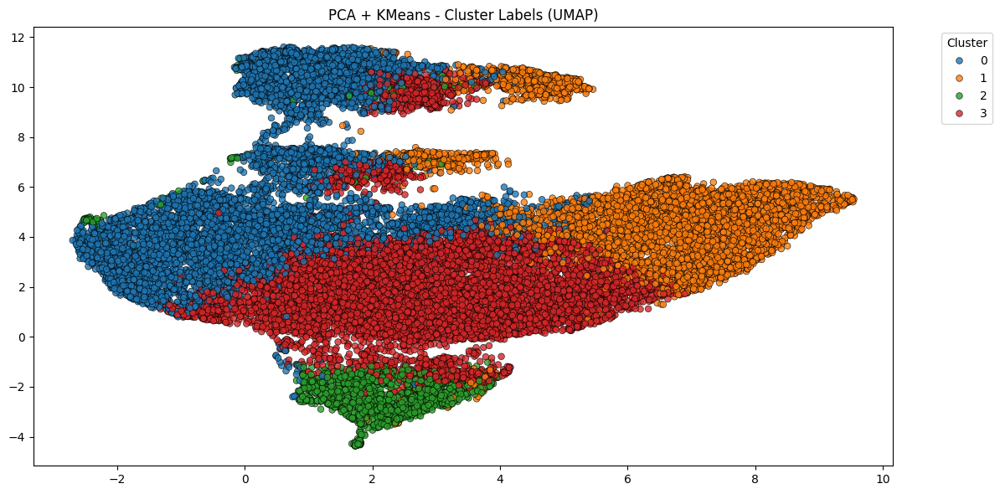

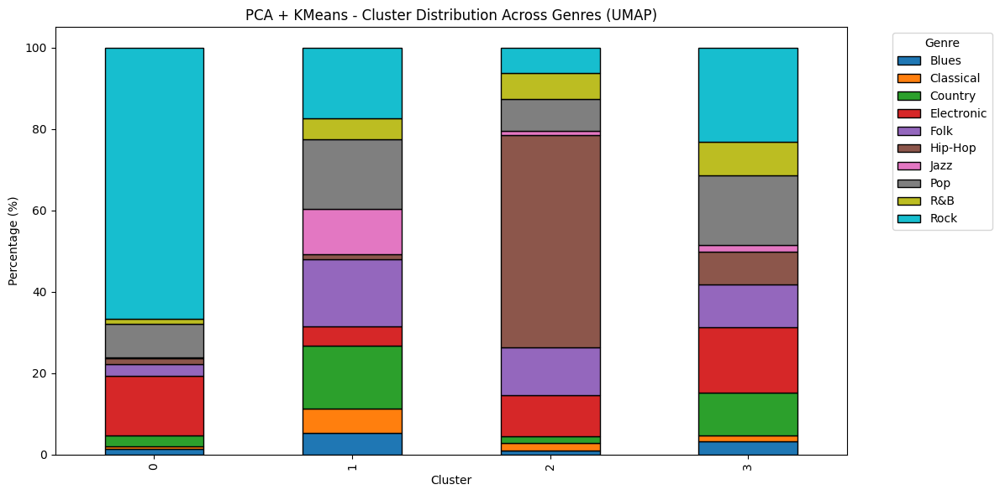

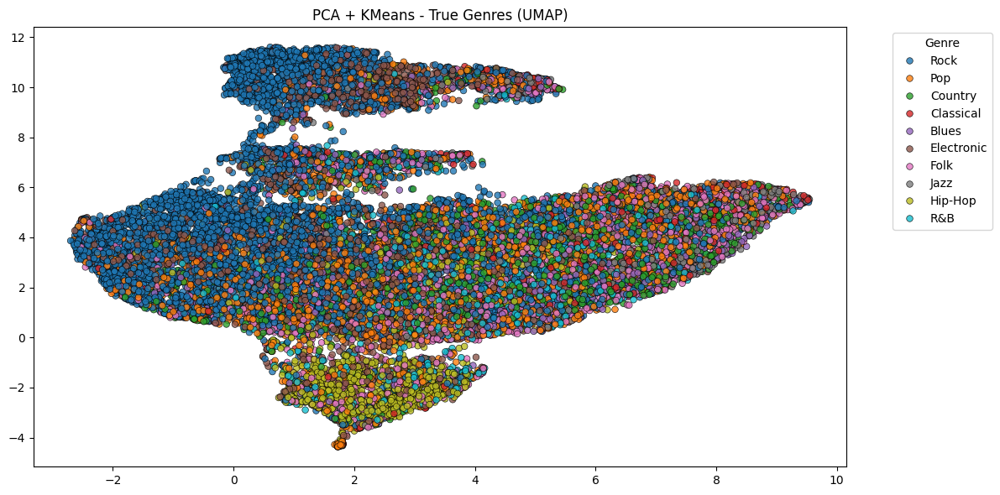

===== PCA + KMeans Cluster to Genre Mapping (UMAP) =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0        122         50      234        1280   245      123    13   728   96   
1        292        325      848         266   896       71   613   934  282   
2         18         34       29         182   213      947    18   142  117   
3        303        125      947        1453   945      725   140  1551  733   

genre  Rock  
row_0        
0      5802  
1       956  
2       113  
3      2089  

Predominant genre per cluster:
row_0
0       Rock
1       Rock
2    Hip-Hop
3       Rock
dtype: object


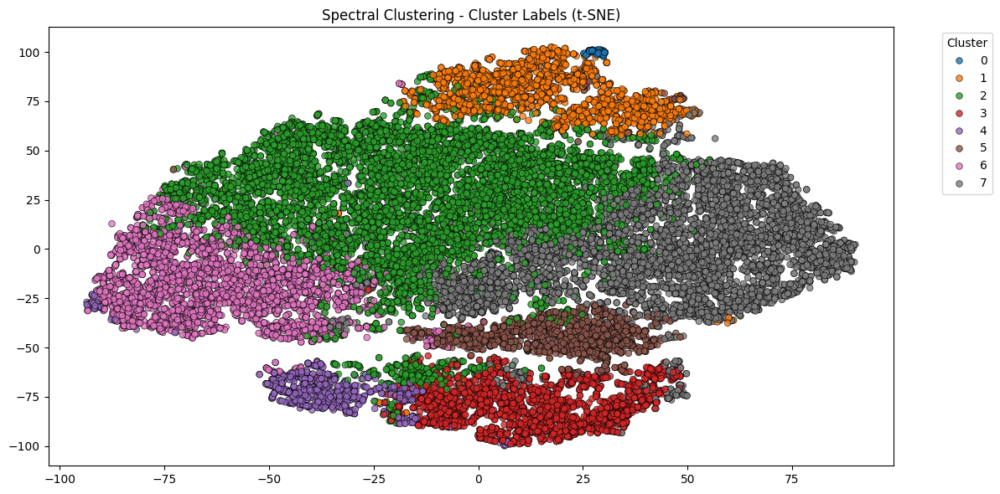

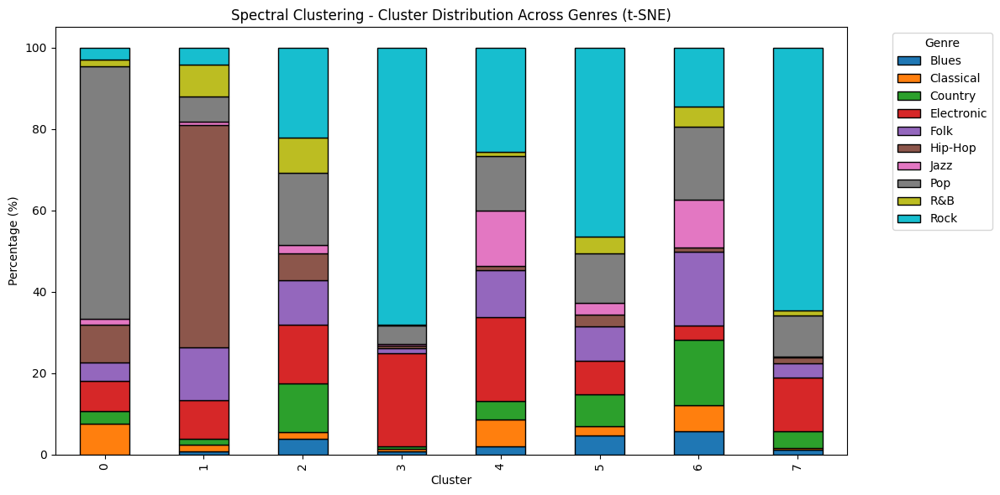

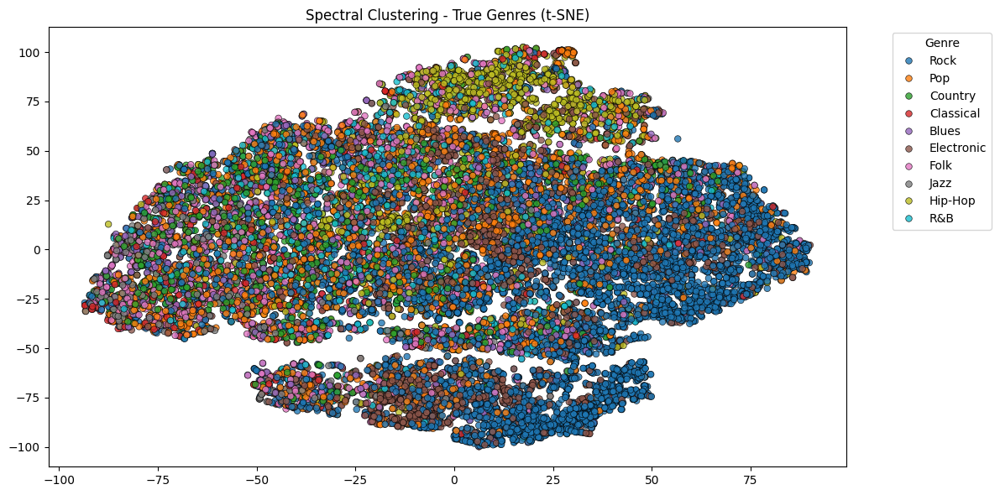

===== Spectral Clustering Cluster to Genre Mapping (t-SNE) =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0          0          5        2           5     3        6     1    41    1   
1         15         32       32         187   260     1093    17   120  158   
2        332        139     1026        1241   930      561   185  1523  740   
3         18         11       15         500    25       15     6    99    7   
4         17         53       36         166    92        9   109   108    9   
5         71         33      119         123   127       45    44   182   61   
6        203        232      572         122   648       39   416   644  175   
7         79         29      256         837   214       98     6   638   77   

genre  Rock  
row_0        
0         2  
1        84  
2      1891  
3      1480  
4       206  
5       701  
6       519  
7      4

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


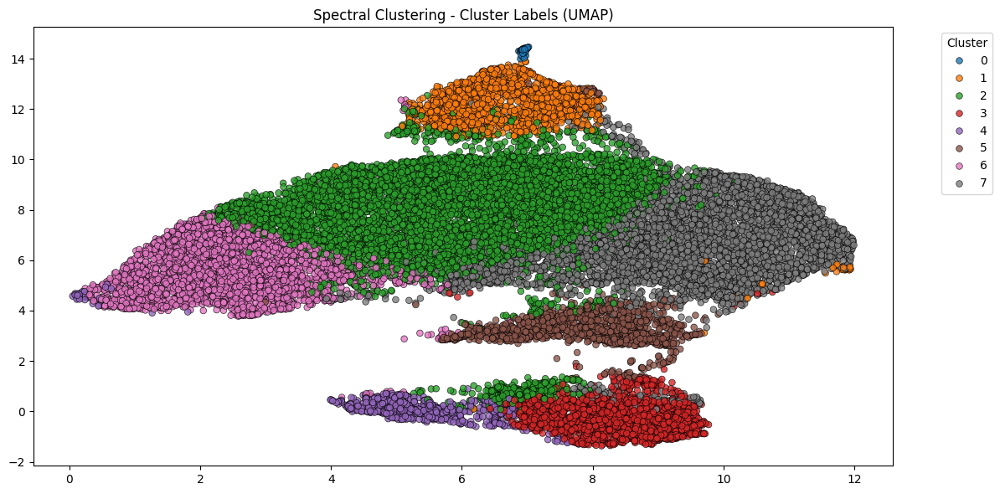

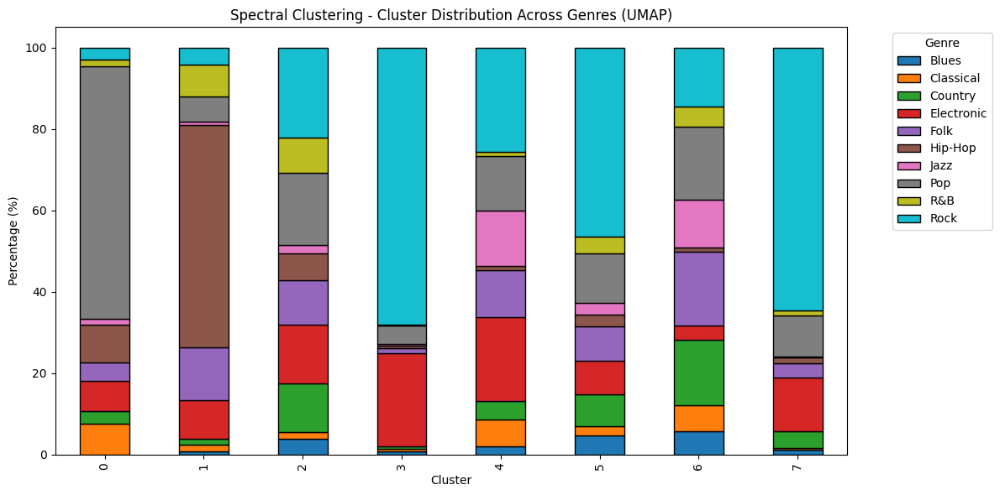

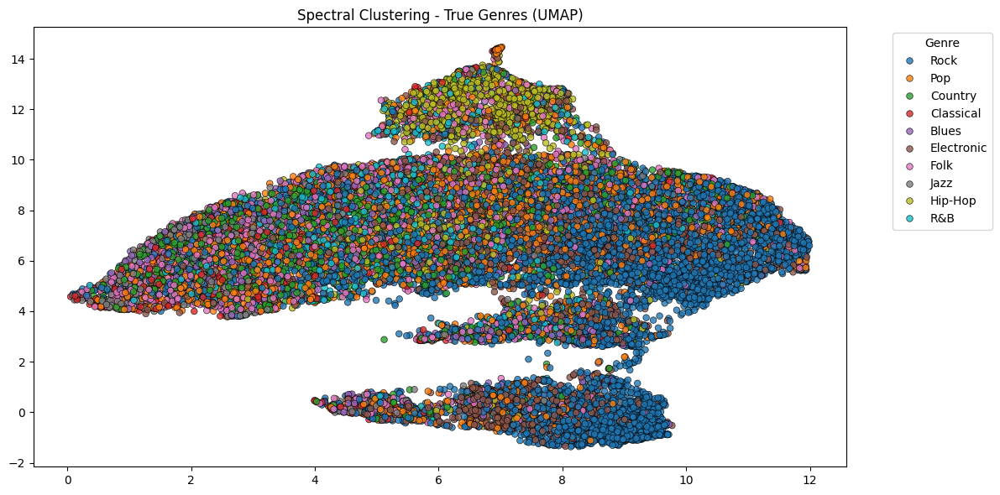

===== Spectral Clustering Cluster to Genre Mapping (UMAP) =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0          0          5        2           5     3        6     1    41    1   
1         15         32       32         187   260     1093    17   120  158   
2        332        139     1026        1241   930      561   185  1523  740   
3         18         11       15         500    25       15     6    99    7   
4         17         53       36         166    92        9   109   108    9   
5         71         33      119         123   127       45    44   182   61   
6        203        232      572         122   648       39   416   644  175   
7         79         29      256         837   214       98     6   638   77   

genre  Rock  
row_0        
0         2  
1        84  
2      1891  
3      1480  
4       206  
5       701  
6       519  
7      40

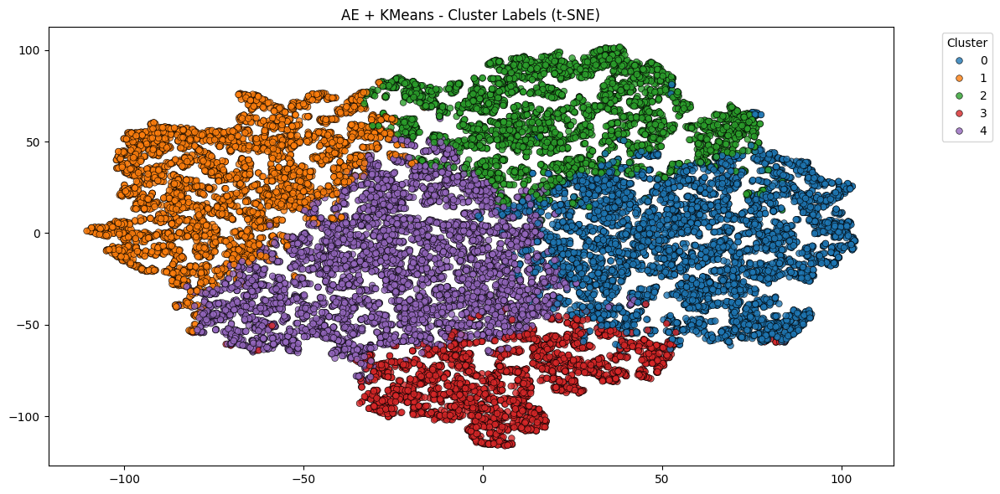

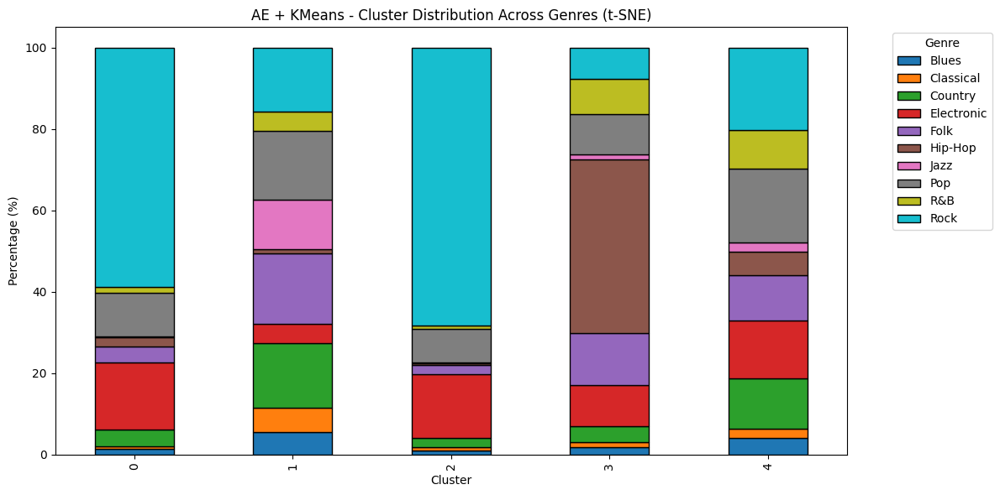

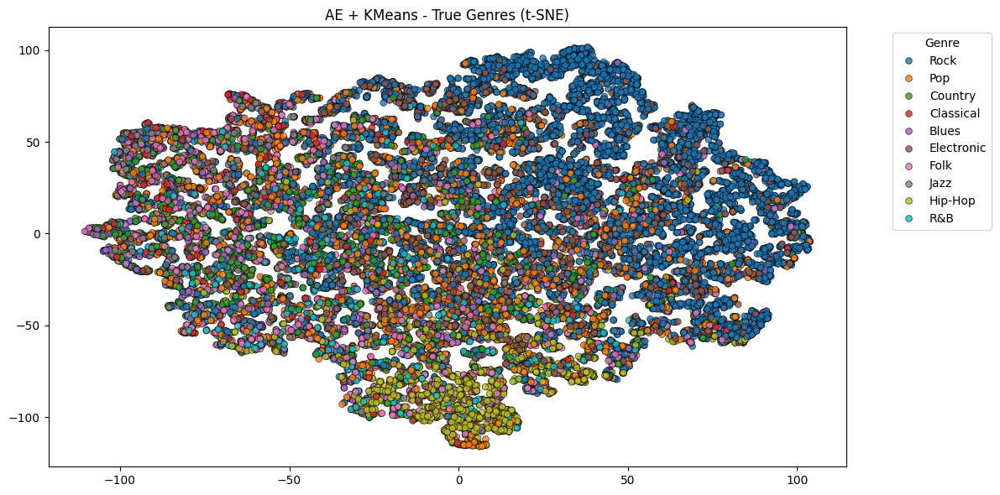

===== AE + KMeans Cluster to Genre Mapping (t-SNE) =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0         94         34      255        1032   245      146    12   678   83   
1        268        278      765         223   833       41   587   809  221   
2         40         38       96         669   102       18     3   355   33   
3         54         37      115         303   379     1267    35   297  255   
4        279        147      827         954   740      394   147  1216  636   

genre  Rock  
row_0        
0      3694  
1       754  
2      2930  
3       228  
4      1354  

Predominant genre per cluster:
row_0
0       Rock
1       Folk
2       Rock
3    Hip-Hop
4       Rock
dtype: object


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


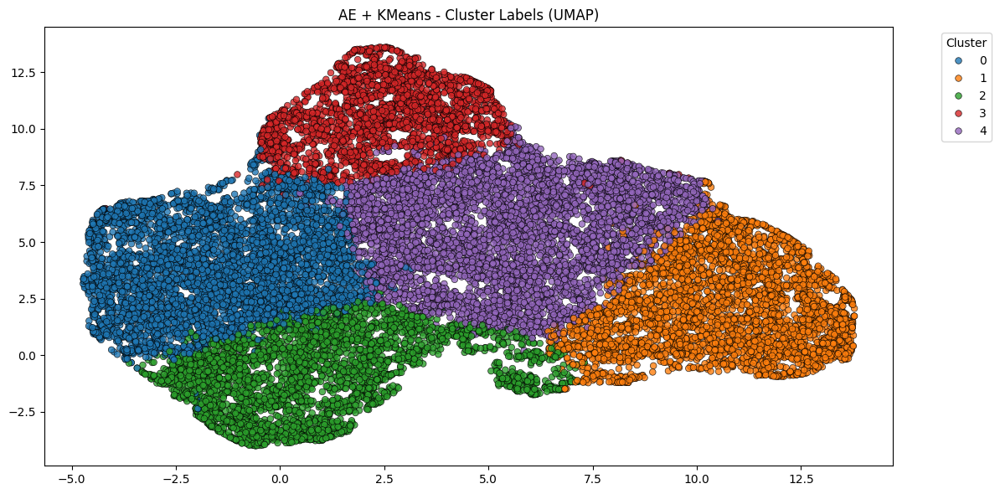

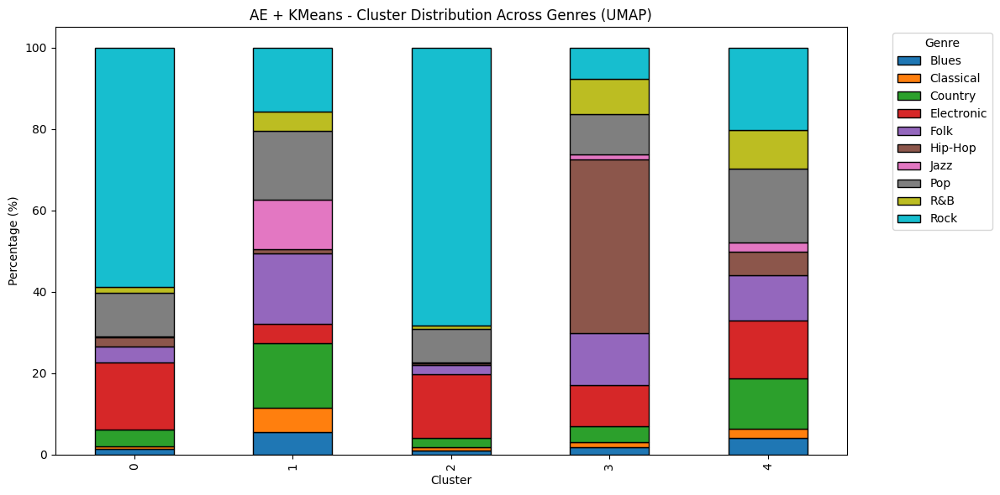

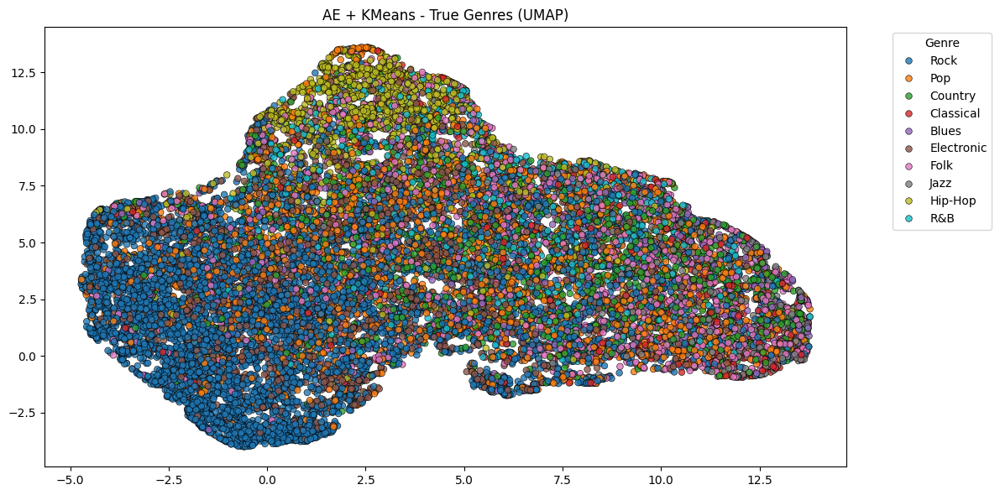

===== AE + KMeans Cluster to Genre Mapping (UMAP) =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0         94         34      255        1032   245      146    12   678   83   
1        268        278      765         223   833       41   587   809  221   
2         40         38       96         669   102       18     3   355   33   
3         54         37      115         303   379     1267    35   297  255   
4        279        147      827         954   740      394   147  1216  636   

genre  Rock  
row_0        
0      3694  
1       754  
2      2930  
3       228  
4      1354  

Predominant genre per cluster:
row_0
0       Rock
1       Folk
2       Rock
3    Hip-Hop
4       Rock
dtype: object


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import umap
from sklearn.manifold import TSNE

def visualize_best_config(features, cluster_labels, true_labels, method_name="Method"):
    reducers = {"t-SNE": TSNE(n_components=2, random_state=42),
                "UMAP": umap.UMAP(n_components=2, random_state=42)}
    
    for reducer_name, reducer in reducers.items():
        embedding = reducer.fit_transform(features)
        
        # Cluster plot 
        plt.figure(figsize=(12,6))
        sns.scatterplot(
            x=embedding[:,0], y=embedding[:,1],
            hue=cluster_labels,
            palette='tab10', s=30, alpha=0.8,
            edgecolor='black', linewidth=0.5
        )
        plt.title(f"{method_name} - Cluster Labels ({reducer_name})")
        plt.legend(title="Cluster", bbox_to_anchor=(1.05,1), loc='upper left')
        plt.tight_layout()
        plt.show()
        
        # Stacked bar plot: cluster vs genre 
        cluster_genre = pd.DataFrame({'cluster': cluster_labels, 'genre': true_labels})
        cluster_counts = pd.crosstab(cluster_genre['cluster'], cluster_genre['genre'])
        cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100
        
        cluster_percent.plot(
            kind='bar', stacked=True, figsize=(12,6),
            colormap='tab10', edgecolor='black'
        )
        plt.title(f"{method_name} - Cluster Distribution Across Genres ({reducer_name})")
        plt.ylabel("Percentage (%)")
        plt.xlabel("Cluster")
        plt.legend(title="Genre", bbox_to_anchor=(1.05,1), loc='upper left')
        plt.tight_layout()
        plt.show()
        
        # True label plot
        plt.figure(figsize=(12,6))
        sns.scatterplot(
            x=embedding[:,0], y=embedding[:,1],
            hue=true_labels,
            palette='tab10', s=30, alpha=0.8,
            edgecolor='black', linewidth=0.5
        )
        plt.title(f"{method_name} - True Genres ({reducer_name})")
        plt.legend(title="Genre", bbox_to_anchor=(1.05,1), loc='upper left')
        plt.tight_layout()
        plt.show()
        
        cluster_to_genre = pd.crosstab(cluster_labels, true_labels)
        print(f"===== {method_name} Cluster to Genre Mapping ({reducer_name}) =====")
        print(cluster_to_genre)
        predominant = cluster_to_genre.idxmax(axis=1)
        print("\nPredominant genre per cluster:")
        print(predominant)

# CVAE
visualize_best_config(best_cvae['latent_features'], best_cvae['cluster_labels'], df['genre'], method_name="CVAE")

# PCA + KMeans
visualize_best_config(best_pca['pca_features'], best_pca['cluster_labels'], df['genre'], method_name="PCA + KMeans")

# Spectral Clustering
visualize_best_config(best_spectral['X_concat_features'], best_spectral['cluster_labels'], df['genre'], method_name="Spectral Clustering")

# AE + KMeans
visualize_best_config(best_ae['ae_features'], best_ae['cluster_labels'], df['genre'], method_name="AE + KMeans")